In [12]:
import yfinance as yf
import plotly.express as px
import ccxt
import pandas as pd
from datetime import datetime, timedelta

### Работа с акциями

In [10]:
# Задаем тикер (символ) акции Apple
ticker = 'AAPL'

# Задаем временной период
period = '1y'  # за последний год

# Скачиваем данные с помощью yfinance
data = yf.download(ticker, period=period, interval='1d')

# Выводим первые несколько строк данных для проверки
print(data.head())

[*********************100%***********************]  1 of 1 completed

                  Open        High         Low       Close   Adj Close  \
Date                                                                     
2023-09-05  188.279999  189.979996  187.610001  189.699997  188.734222   
2023-09-06  188.399994  188.850006  181.470001  182.910004  181.978806   
2023-09-07  175.179993  178.210007  173.539993  177.559998  176.656036   
2023-09-08  178.350006  180.240005  177.789993  178.179993  177.272858   
2023-09-11  180.070007  180.300003  177.339996  179.360001  178.446869   

               Volume  
Date                   
2023-09-05   45280000  
2023-09-06   81755800  
2023-09-07  112488800  
2023-09-08   65551300  
2023-09-11   58953100  


In [4]:
#проверка на пустые значения
data.isnull().sum()

Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

In [5]:
#небольшое саммари по датафрейму
data.describe()

,Open,High,Low,Close,Adj Close,Volume
count,251.000000,251.000000,251.000000,251.000000,251.000000,2.510000e+02
mean,190.553466,192.324223,188.923745,190.686534,190.169562,5.983090e+07
std,18.582519,18.827076,18.181495,18.519369,18.687913,2.518591e+07
min,165.350006,166.399994,164.080002,165.000000,164.585999,2.404830e+07
25%,175.440002,177.395004,173.840004,175.615005,174.752983,4.592600e+07
50%,187.039993,188.300003,185.190002,186.860001,186.153625,5.343900e+07
75%,196.095001,197.190002,194.610001,196.389999,195.919525,6.598470e+07
max,236.479996,237.229996,233.089996,234.820007,234.548523,2.464214e+08


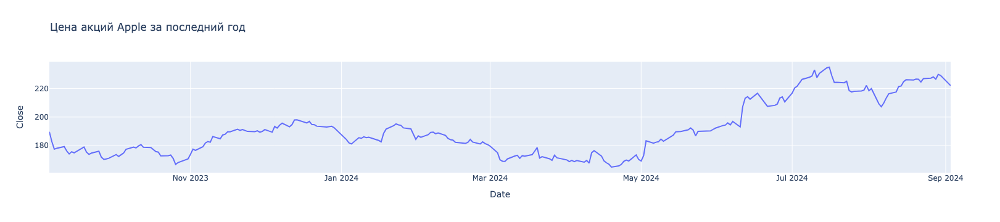

In [6]:
# Используем plotly.express для создания графика
fig = px.line(data, x=data.index, y='Close', title='Цена акций Apple за последний год')

# Настраиваем отображение графиков в JupyterLab
fig.show()

In [8]:
#вывод в файл
output_file = ticker + '_' + period + ".parquet" #выбран формат который больше всего мне встречался
data.to_parquet(output_file)

### Работа с криптой

In [44]:
exchange = ccxt.bybit() #с этой биржей работаю, по этому выбор пал на нее

In [59]:
symbol = 'BTC/USDT'  # Торговая пара
period = 365
timeframe = '5m'
limit = 1000  # Лимит на количество свечей за один запрос
since = exchange.parse8601(f'{(datetime.now() - timedelta(days=period)).isoformat()}')

In [46]:
# Инициализация списка для хранения данных
all_ohlcv = []

# Шаг 2: Итеративная загрузка данных с учетом лимита
while True:
    ohlcv = exchange.fetch_ohlcv(symbol, timeframe, since=since, limit=limit)
    if not ohlcv:
        break
    all_ohlcv.extend(ohlcv)
    
    # Обновляем `since` для следующего запроса
    since = ohlcv[-1][0] + 1  # Устанавливаем начало следующего интервала на конец предыдущего + 1 мс


In [48]:
# Преобразование данных в DataFrame
df = pd.DataFrame(all_ohlcv, columns=['timestamp', 'open', 'high', 'low', 'close', 'volume'])

In [49]:
# Преобразование timestamp в datetime
df['timestamp'] = pd.to_datetime(df['timestamp'], unit='ms')

In [50]:
#проверка на пустые значения
df.isnull().sum()

timestamp    0
open         0
high         0
low          0
close        0
volume       0
dtype: int64

In [51]:
#небольшое саммари по датафрейму
df.describe()

,open,high,low,close,volume
count,105121.000000,105121.000000,105121.000000,105121.000000,105121.000000
mean,51576.150760,51626.530070,51524.284193,51576.455764,48.440125
std,14704.993394,14725.215134,14683.791913,14704.794373,67.321132
min,25005.980000,25045.960000,24899.970000,25005.980000,0.032461
25%,39792.730000,39831.730000,39751.610000,39795.410000,14.738294
50%,57079.720000,57161.270000,56999.340000,57080.150000,31.320892
75%,64752.250000,64828.620000,64665.630000,64752.250000,60.339703
max,73633.750000,73800.000000,73574.130000,73633.750000,2528.142728


In [52]:
df.tail()

,timestamp,open,high,low,close,volume
105116,2024-09-03 18:30:00,57889.96,58037.27,57876.63,57989.00,56.048307
105117,2024-09-03 18:35:00,57989.00,58021.05,57938.96,57996.68,62.711540
105118,2024-09-03 18:40:00,57996.68,58058.00,57954.80,58038.49,72.826497
105119,2024-09-03 18:45:00,58038.49,58055.25,57986.62,57989.15,76.390634
105120,2024-09-03 18:50:00,57989.15,58014.41,57989.15,58012.38,3.815092


In [61]:
#Сохранение данных в формате Apache Parquet
symbol= symbol.replace('/','_')
parquet_file = symbol + '_' + str(period) + '_.parquet'
df.to_parquet(parquet_file)

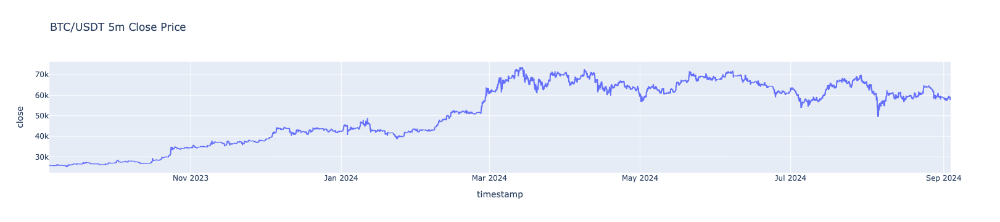

In [56]:
#Построение графика с использованием Plotly Express
fig = px.line(df, x='timestamp', y='close', title='BTC/USDT 5m Close Price')
fig.show()